# 1. Supervised, Semi-Supervised, and Unsupervised Learning




**(a) Download the Blood Transfusion Service Center Data Set from: https://archive. ics.uci.edu/ml/datasets/Blood+Transfusion+Service+Center. This data has two output classes.Use the first 20% of the positive and negative classes in the file as the test set and the rest as the training set.**


In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split,RandomizedSearchCV,KFold,GridSearchCV
from sklearn.svm import LinearSVC
from numpy import random as rm
from sklearn import metrics
from scipy.stats import uniform
from sklearn.preprocessing import StandardScaler
import random, math
myseed=11109
random.seed=myseed
from sklearn.preprocessing import MinMaxScaler
#import scikitplot as skplt
#from ggplot import *
from sklearn.cluster import KMeans
#from scipy.spatial import distance
from imblearn.over_sampling import SMOTE
from __future__ import division

In [0]:
data=pd.read_csv('drive/transfusion.txt')


In [0]:
k=0
j=0
ind=list(data.index.values)
k1,j1=[],[]
for i in range(0,748):
  if(k<data["whether he/she donated blood in March 2007"].value_counts()[0]*0.2 and data.iloc[i,4]==0):
    k=k+1
    ind.remove(i)
    k1.append(i)
  if(j<data["whether he/she donated blood in March 2007"].value_counts()[1]*0.2 and data.iloc[i,4]==1):
    j=j+1
    ind.remove(i)
    j1.append(i)
testset=pd.DataFrame(columns=["Recency (months)","Frequency (times)","Monetary (c.c. blood)","Time (months)","whether he/she donated blood in March 2007"])
testset=testset.append(data.loc[j1],ignore_index=True)
testset=testset.append(data.loc[k1],ignore_index=True)
trainset=pd.DataFrame(columns=["Recency (months)","Frequency (times)","Monetary (c.c. blood)","Time (months)","whether he/she donated blood in March 2007"])
trainset=trainset.append(data.loc[ind],ignore_index=True)
xtrain=trainset.drop(['whether he/she donated blood in March 2007'],axis=1)
xtest=testset.drop(['whether he/she donated blood in March 2007'],axis=1)
ytest=testset['whether he/she donated blood in March 2007'].astype('int')
ytrain=trainset['whether he/she donated blood in March 2007'].astype('int')
sd=MinMaxScaler()
xtrain=sd.fit_transform(xtrain)
xtest=sd.transform(xtest)

 **Answer:** The first 20% were extracted for both the classes.

**(b) Supervised Learning: Train an L1-penalized SVM to classify the data. Use 5 fold cross validation to choose the penalty parameter. Use normalized data. Report the accuracy, AUC, ROC, and confusion matrix for both training and test sets.**

In [131]:
C_range = 10. ** np.arange(-8, 8)
params={'C':C_range}
mod_sp=LinearSVC(penalty='l1',dual=False)
sv=GridSearchCV(mod_sp,params,cv=5)
sv.fit(xtrain,ytrain)
print(pd.DataFrame(sv.cv_results_))
mod_g=LinearSVC(penalty='l1',dual=False,C=1)
mod_g.fit(xtrain,ytrain)
yp_tr=mod_g.predict(xtrain)
yp_tt=mod_g.predict(xtest)

    mean_fit_time  mean_score_time  mean_test_score  mean_train_score param_C  \
0        0.000877         0.000396         0.762542          0.762543   1e-08   
1        0.000679         0.000359         0.762542          0.762543   1e-07   
2        0.000679         0.000336         0.762542          0.762543   1e-06   
3        0.000684         0.000324         0.762542          0.762543   1e-05   
4        0.000682         0.000361         0.762542          0.762543  0.0001   
5        0.000693         0.000329         0.762542          0.762543   0.001   
6        0.000730         0.000338         0.762542          0.762543    0.01   
7        0.000998         0.000359         0.765886          0.765890     0.1   
8        0.001621         0.000485         0.759197          0.788029       1   
9        0.001719         0.000421         0.759197          0.792207      10   
10       0.004343         0.000557         0.757525          0.793877     100   
11       0.001156         0.

/usr/local/lib/python2.7/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning: You are accessing a training score ('mean_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/usr/local/lib/python2.7/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning: You are accessing a training score ('split0_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/usr/local/lib/python2.7/dist-packages/sklearn/utils/deprecation.py:122: FutureWarning: You are accessing a training score ('split1_train_score'), which will not be available by default any more in 0.21. If you need training scores, please set return_train_score=True
  warnings.warn(*warn_args, **warn_kwargs)
/usr/local/lib/python2.7/dist-packages/sklearn/utils/deprecation.py:1

**Answer:** The cross-validation was done  with very large/small values of C and the best penalty parameter was determined to lie between 0 and 1. Now the best model is utilized on testset.

In [132]:
print('The Accuracy on training set is ',metrics.accuracy_score(ytrain,yp_tr))
print('The Accuracy on testing set is ',metrics.accuracy_score(ytest,yp_tt))
print("The Confusion matrix of training set is \n",metrics.confusion_matrix(ytrain,yp_tr))
print("The Confusion matrix of testing set is \n",metrics.confusion_matrix(ytest,yp_tt))

('The Accuracy on training set is ', 0.7725752508361204)
('The Accuracy on testing set is ', 0.8)
('The Confusion matrix of training set is \n', array([[449,   7],
       [129,  13]]))
('The Confusion matrix of testing set is \n', array([[104,  10],
       [ 20,  16]]))


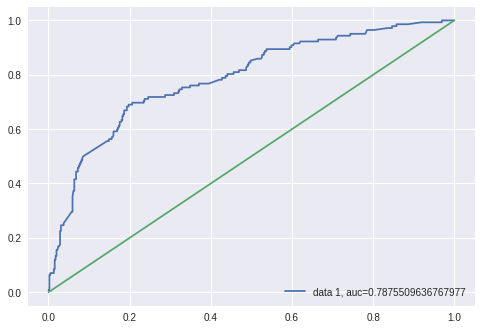

The AUC is 0.7875509636767977


In [134]:
x=np.linspace(0,1,100)
y_pred_proba = mod_g.decision_function(xtrain)
fpr, tpr, _ = metrics.roc_curve(ytrain,  y_pred_proba)
auc = metrics.roc_auc_score(ytrain, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.plot(x,x)
plt.legend(loc=4)
#skplt.metrics.plot_roc_curve(ytrain,y_pred_proba)
plt.show()
print('The AUC is '+str(auc))

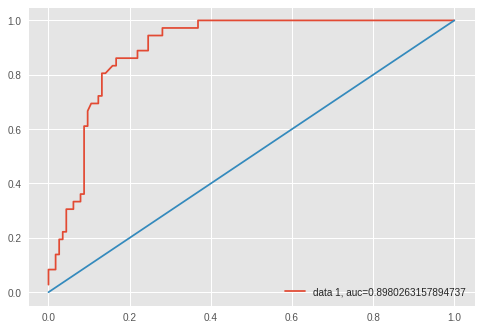

The AUC is 0.8980263157894737


In [135]:
plt.style.use('ggplot')
y_pred_proba = mod_g.decision_function(xtest)
fpr, tpr, _ = metrics.roc_curve(ytest,  y_pred_proba)
auc = metrics.roc_auc_score(ytest, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.plot(x,x)
plt.legend(loc=4)
plt.show()
print('The AUC is '+str(auc))

**c) Semi-Supervised Learning/ Self-training: select 50% of the positive class along with 50% of the negative class in the training set as labeled data and the rest as unlabelled data. You can select them randomly.
i. Train an L1-penalized SVM to classify the labeled data. Choose the penalty parameter using 5 fold cross validation.**

In [136]:
data['whether he/she donated blood in March 2007'].value_counts()

0    570
1    178
Name: whether he/she donated blood in March 2007, dtype: int64

In [0]:
k=0
j=0
ind=list(trainset.index.values)
k1,j1=[],[]
for i in range(0,598):
  if(k<228 and data.iloc[i,4]==0):
    k=k+1
    ind.remove(i)
    k1.append(i)
  if(j<71 and data.iloc[i,4]==1):
    j=j+1
    ind.remove(i)
    j1.append(i)
labeldata=pd.DataFrame(columns=["Recency (months)","Frequency (times)","Monetary (c.c. blood)","Time (months)","whether he/she donated blood in March 2007"])
labeldata=labeldata.append(data.loc[j1],ignore_index=True)
labeldata=labeldata.append(data.loc[k1],ignore_index=True)
unlabel=pd.DataFrame(columns=["Recency (months)","Frequency (times)","Monetary (c.c. blood)","Time (months)","whether he/she donated blood in March 2007"])
unlabel=unlabel.append(data.loc[ind],ignore_index=True)

In [0]:
xtrain1=labeldata.drop(['whether he/she donated blood in March 2007'],axis=1)
ytrain1=labeldata['whether he/she donated blood in March 2007'].astype('int')
xtest1=unlabel.drop(['whether he/she donated blood in March 2007'],axis=1)
ytest1=unlabel['whether he/she donated blood in March 2007'].astype('int')
sd1=MinMaxScaler()
xtrain1=sd1.fit_transform(xtrain1)
xtest1=sd1.transform(xtest1)

In [139]:
C_range = 10. ** np.arange(-8, 8)
#C_range = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
params={'C':C_range}
mod_sp=LinearSVC(penalty='l1',dual=False)
sv=GridSearchCV(mod_sp,params,cv=5)
sv.fit(xtrain1,ytrain1)
print(pd.DataFrame(sv.cv_results_))

    mean_fit_time  mean_score_time  mean_test_score  mean_train_score param_C  \
0        0.000606         0.000308         0.762542          0.762544   1e-08   
1        0.000528         0.000311         0.762542          0.762544   1e-07   
2        0.000606         0.000322         0.762542          0.762544   1e-06   
3        0.000572         0.000310         0.762542          0.762544   1e-05   
4        0.000516         0.000294         0.762542          0.762544  0.0001   
5        0.000511         0.000289         0.762542          0.762544   0.001   
6        0.000506         0.000296         0.762542          0.762544    0.01   
7        0.000581         0.000296         0.762542          0.763377     0.1   
8        0.000745         0.000299         0.732441          0.792722       1   
9        0.000806         0.000298         0.695652          0.800264      10   
10       0.000867         0.000304         0.695652          0.799431     100   
11       0.000884         0.

**Answer:** The penalty parameter C was determined.

**ii. Find the unlabeled data point that is the closest to the decision boundary of the SVM. Let the SVM label it (ignore its true label), and add it to the labeled data, and retrain the SVM. Continue this process until all unlabeled data are used. Test the final SVM on the test data and report the accuracy, AUC, ROC, and confusion matrix for the test set.**

In [0]:
yo=[]
bro=np.array((unlabel.index.values),dtype=int)
df=labeldata
xtrain1=df.drop(['whether he/she donated blood in March 2007'],axis=1)
ytrain1=df['whether he/she donated blood in March 2007'].astype('int')
xtrain1=sd.fit_transform(xtrain1)
for i in range(0,unlabel.shape[0]):
  modt=LinearSVC(penalty='l1',dual=False,C=.01)
  modt.fit(xtrain1,ytrain1)
  cf=modt.decision_function(xtest1[bro])
  cf=np.absolute(cf)
  subset=unlabel.loc[bro].iloc[cf.argsort()[:1]].index.values
  yo.append(subset)
  bro=np.setdiff1d(bro,subset)
  df=df.append(unlabel.loc[subset])
  xtrain1=df.drop(['whether he/she donated blood in March 2007'],axis=1)
  xtrain1=sd.fit_transform(xtrain1)
  ytrain1=df['whether he/she donated blood in March 2007'].astype('int')
  
modt=LinearSVC(penalty='l1',dual=False,C=1)
modt.fit(xtrain,ytrain)  
yp_tr=modt.predict(xtrain)
yp_tt=modt.predict(xtest)

In [143]:
print('The Accuracy on training set is '+str(metrics.accuracy_score(ytrain1,yp_tr)))
print('The Accuracy on testing set is '+str(metrics.accuracy_score(ytest,yp_tt)))
print("The Confusion matrix of training set is \n"+str(metrics.confusion_matrix(ytrain,yp_tr)))
print("The Confusion matrix of testing set is \n"+str(metrics.confusion_matrix(ytest,yp_tt)))

The Accuracy on training set is 0.6956521739130435
The Accuracy on testing set is 0.8
The Confusion matrix of training set is 
[[449   7]
 [129  13]]
The Confusion matrix of testing set is 
[[104  10]
 [ 20  16]]


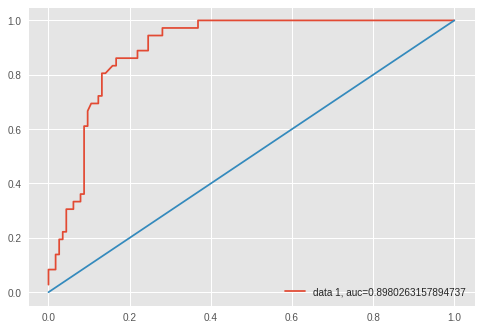

In [145]:
plt.style.use('ggplot')
y_pred_proba = modt.decision_function(xtest)
fpr, tpr, _ = metrics.roc_curve(ytest,  y_pred_proba)
auc = metrics.roc_auc_score(ytest, y_pred_proba)
plt.plot(fpr,tpr,label="data 1, auc="+str(auc))
plt.plot(x,x)
plt.legend(loc=4)
plt.show()

The AUC is 0.8980263.

**(d) Unsupervised Learning: Run k-means algorithm on the whole training set. Ignore the labels of the data, and assume k = 2.
i. Run the k-means algorithm multiple times. How do you make sure that the algorithm was not trapped in a local minimum?**


**Answer:** The method to make sure that the algorithm is not trapped in local minimum is by Running multiple iterations with different values of initializations of the cluster centroids. This is achieved in the algorithm by setting the parameter 'init'=random and 1000 iterations were run.

In [0]:
kmod=KMeans(n_clusters=2,max_iter=1000,init='random')
kmod.fit(xtrain)
a=kmod.cluster_centers_[0]
b=kmod.cluster_centers_[1]
d1=np.sqrt(np.sum((xtrain-b)**2, axis=1))
d2=np.sqrt(np.sum((xtrain-a)**2, axis=1))
ind1=np.argsort(d1)[:30]
ind2=np.argsort(d2)[:30]

**ii. Compute the centers of the two clusters and find the closest 30 data points to each center. Read the true labels of those 30 data points and take a majority poll within them. The majority poll becomes the label predicted by k-means for the members of each cluster. Then compare the labels provided by k- means with the true labels of the training data and report accuracy and the confusion matrix.**

In [147]:
ytrain[ind1].value_counts()

0    24
1     6
Name: whether he/she donated blood in March 2007, dtype: int64

In [148]:
ytrain[ind2].value_counts()

0    22
1     8
Name: whether he/she donated blood in March 2007, dtype: int64

**Answer** Both clusters have the same majority label because there is a class imbalance in the dataset. So, this class imbalanced was removed by SMOTE technique.

In [0]:
sampl=SMOTE(kind='regular')
Xres,yres=sampl.fit_sample(xtrain,ytrain)
kmod1=KMeans(n_clusters=2,max_iter=1000,init='random')
kmod1.fit(Xres)
a1=kmod1.cluster_centers_[0]
b1=kmod1.cluster_centers_[1]
d1_1=np.sqrt(np.sum((Xres-a1)**2, axis=1))
d2_1=np.sqrt(np.sum((Xres-b1)**2, axis=1))
ind1_1=np.argsort(d1_1)[:100]
ind2_1=np.argsort(d2_1)[:100]

In [10]:
unique, counts = np.unique(yres[ind1_1], return_counts=True)
print(unique,counts)

(array([0, 1]), array([48, 52]))


In [11]:
unique, counts = np.unique(yres[ind2_1], return_counts=True)
print(unique,counts)

(array([0, 1]), array([55, 45]))


**Answer**: The first cluster has 1 as majority label and the second cluster as 0 as majority label. This can be observed from the above code.

**iii. Classify test data based on their proximity to the centers of the clusters. Report accuracy and confusion matrix for the test data.**


**Answer:**

In [0]:
ypredf=[]
d1_2=np.sqrt(np.sum((xtest-a1)**2, axis=1))
d2_2=np.sqrt(np.sum((xtest-b1)**2, axis=1))
for i in range(0,xtest.shape[0]):
  if(d1_2[i]>d2_2[i]):
    ypredf.append(0)
  else:
    ypredf.append(1)
ypredf=np.array(ypredf)    
    

In [158]:
print('The accuracy score is',metrics.accuracy_score(ytest,ypredf))

('The accuracy score is', 0.6333333333333333)


In [164]:
print("The confusion matrix is ",metrics.confusion_matrix(ytest,ypredf))

('The confusion matrix is ', array([[82, 32],
       [23, 13]]))






**(f) One expects that supervised learning on the full data set works better than semi- supervised learning with half of the data set labeled.One expects that unsupervised learning underperforms in such situations. Compare the results you obtained by those methods.**

**Answer:** The Supervised Learning method performs better than semi-supervised Learning method as expected. Both at the end have the same test accuracy as all data is used up by semi-supervised learing. Semi-supervised Learning has a naive assumption when the closest points majority poll is taken. Also the majority poll was quite close in both the clusters and there is no clear outright label which one can safely assume to be present for a particular  cluster.
So Semi-supervised and Unsupervised Learning techniques were not successful nor useful for this particular dataset.
Also, the dataset had class imbalance which could be causing such problems.

# 2. K-Means Clustering on a Multi-Class and Multi-Label Data Set

In [0]:
def hamming_score(yt,yp):
  sum1=0
  for i in range(0,yt.shape[0]):
    if(yt.iloc[i,0]!=yp.iloc[i,0]):
      sum1=sum1+1  
    if(yt.iloc[i,1]!=yp.iloc[i,1]):
      sum1=sum1+1
    if(yt.iloc[i,2]!=yp.iloc[i,2]):
      sum1=sum1+1
  return sum1/(yt.shape[0]*yt.shape[1])

**(a) Use k-means clustering on Anuran Calls (MFCCs) Data Set of Homework 4. Choose k automatically based on one of the methods provided in the slides (CH or Gap Statistics or scree plots) or any other method you know.**

**Answer**: The Silhouette score is used to determine 'k' for KMeans. The beat value was 4.

In [0]:
bro=[]
frogs=pd.read_csv('drive/Frogs_MFCCs.csv')
frogs=frogs.drop(['RecordID'],axis=1)
train1,test1=train_test_split(frogs,test_size=0.3)
xtrain=train1.drop(['Family','Genus',"Species"],axis=1)
ytrain=train1[['Family','Genus','Species']]
xtest=test1.drop(['Family','Genus',"Species"],axis=1)
ytest=test1[['Family','Genus','Species']]
range_n_clusters = np.arange(2,10)
for n_clusters in range_n_clusters:
  clusterer = KMeans(n_clusters=n_clusters, random_state=10)
  cluster_labels = clusterer.fit_predict(xtrain)
  bro.append(metrics.silhouette_score(xtrain, cluster_labels))  
kmod=KMeans(n_clusters=4,max_iter=1000,init='random',random_state=13)
kmod.fit(xtrain)
dist=kmod.transform(xtrain)
dab=pd.DataFrame(columns=['value'])
dab['value']=kmod.fit_predict(xtrain)

No handlers could be found for logger "matplotlib.legend"


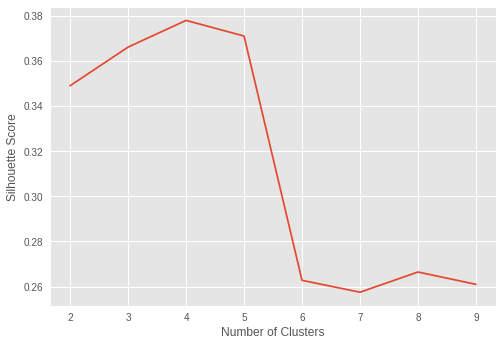

In [168]:
plt.style.use('ggplot')
plt.plot(range_n_clusters,np.array(bro))
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.legend()
plt.show()

**(b) In each cluster, determine which family is the majority by reading the true labels. Repeat for genus and species.**

**Answer** The majority label for each cluster was determined.

In [96]:
ypred=pd.DataFrame(columns=['Family','Genus','Species'])
for key in range(0,3):
  dab['value']=pd.Series(g)
  for i in range(0,4):
    print(ytrain.columns[key]," Cluster ",i,ytrain.iloc[dab.query('value=='+str(i)).index.values,key].value_counts().index.values[0])
vals_to_replace = {0:'Hylidae',1:'Hylidae', 2:'Dendrobatidae',3: 'Leptodactylidae'}
vals_to_replace1 ={0: 'Hypsiboas',1:'Hypsiboas',2:'Ameerega',3: 'Adenomera'}
vals_to_replace2 ={0:'HypsiboasCinerascens',1:'HypsiboasCordobae',2:'Ameeregatrivittata', 3: 'AdenomeraHylaedactylus'}
ypred['Family'] = dab['value'].map(vals_to_replace)
ypred['Genus'] = dab['value'].map(vals_to_replace1)
ypred['Species'] = dab['value'].map(vals_to_replace2)      

('Family', ' Cluster ', 0, 'Hylidae')
('Family', ' Cluster ', 1, 'Hylidae')
('Family', ' Cluster ', 2, 'Dendrobatidae')
('Family', ' Cluster ', 3, 'Leptodactylidae')
('Genus', ' Cluster ', 0, 'Hypsiboas')
('Genus', ' Cluster ', 1, 'Hypsiboas')
('Genus', ' Cluster ', 2, 'Ameerega')
('Genus', ' Cluster ', 3, 'Adenomera')
('Species', ' Cluster ', 0, 'HypsiboasCinerascens')
('Species', ' Cluster ', 1, 'HypsiboasCordobae')
('Species', ' Cluster ', 2, 'Ameeregatrivittata')
('Species', ' Cluster ', 3, 'AdenomeraHylaedactylus')


**(c) Now for each cluster you have a majority label triplet (family, genus, species). Calculate the average Hamming distance between the true labels and the labels assigned by clusters.**

In [0]:
dab1=pd.DataFrame(columns=['value'])
dab1['value']=kmod.predict(xtest)
ypred1=pd.DataFrame(columns=['Family','Genus','Species'])
ypred1['Family'] = dab1['value'].map(vals_to_replace)
ypred1['Genus'] = dab1['value'].map(vals_to_replace1)
ypred1['Species'] = dab1['value'].map(vals_to_replace2)

In [127]:
print('The train hamming score is ',hamming_score(ytrain,ypred))

('The train hamming score is ', 0.22736298649722)


In [128]:
print('The test hamming score is ',hamming_score(ytest,ypred1))

('The test hamming score is ', 0.20827543615871547)


# 3. ISLR 10.7.2

**2. Suppose that we have four observations, for which we compute a dissimilarity matrix, given by
⎡⎢ 0.30.40.7⎤⎥ ⎢⎣0.3 0.5 0.8⎥⎦.
0.4 0.5 0.45 0.7 0.8 0.45
For instance, the dissimilarity between the first and second obser- vations is 0.3, and the dissimilarity between the second and fourth observations is 0.8.
(a) On the basis of this dissimilarity matrix, sketch the dendrogram that results from hierarchically clustering these four observa- tions using complete linkage. Be sure to indicate on the plot the height at which each fusion occurs, as well as the observations corresponding to each leaf in the dendrogram.**

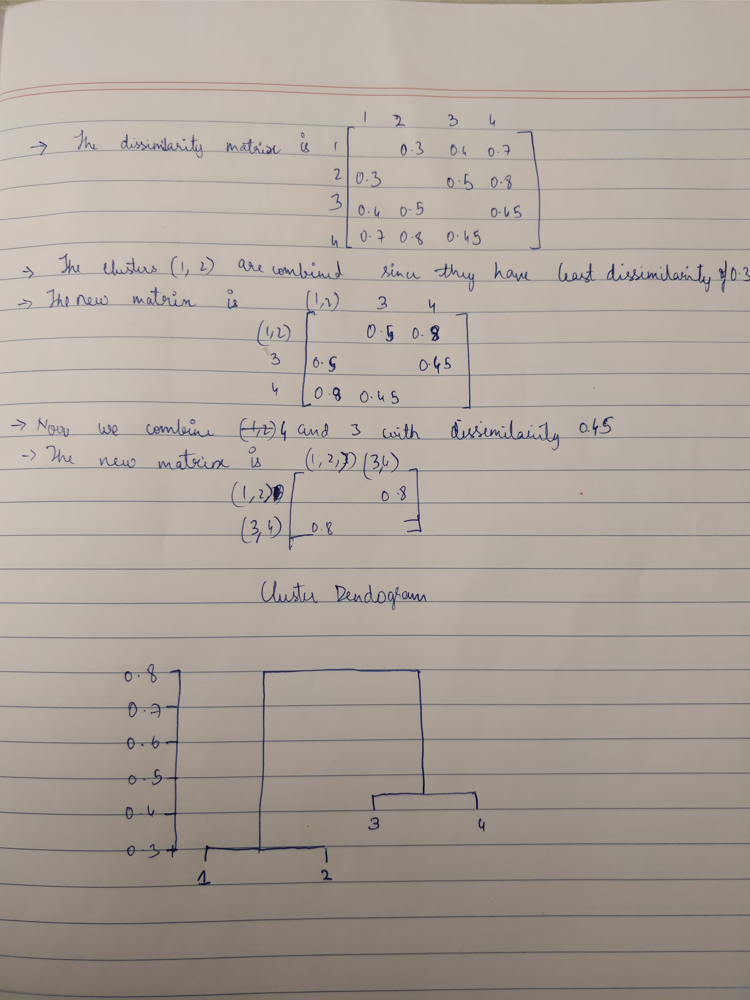

In [5]:
from IPython.display import Image, display
display(Image(filename=r'drive/IMG_20180414_182549.jpg'))

**(b) Repeat (a), this time using single linkage clustering.**

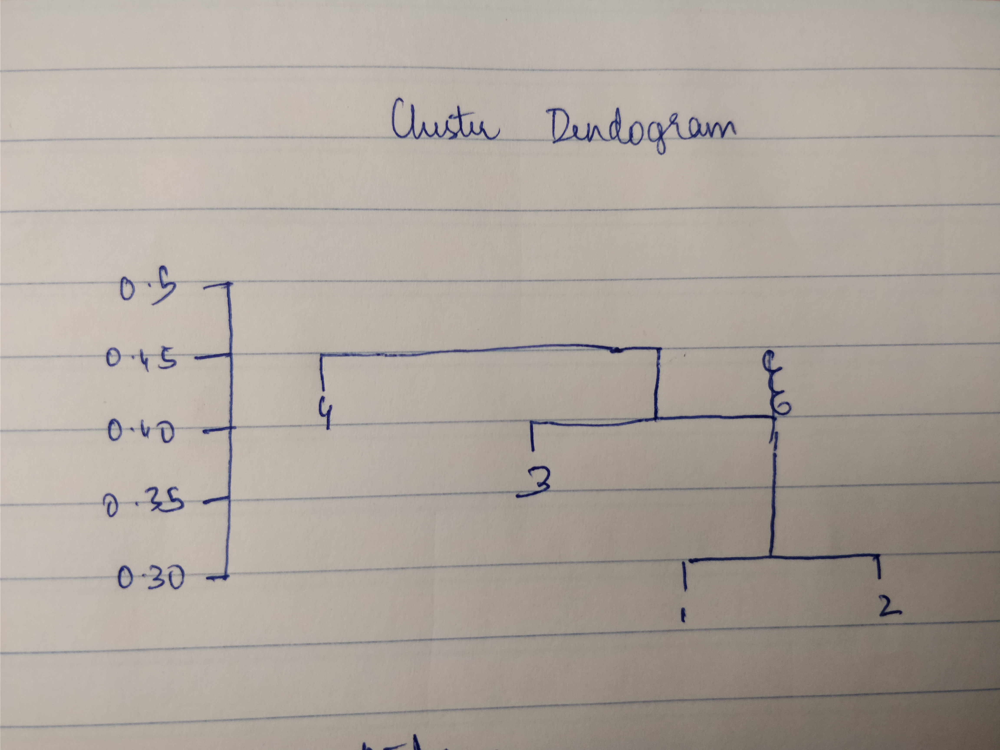

In [6]:
from IPython.display import Image, display
display(Image(filename=r'drive/IMG_20180414_183007.jpg'))

**(c) Suppose that we cut the dendogram obtained in (a) such that two clusters result. Which observations are in each cluster?**

Answer: The observations in each cluster are (1,2) and (3,4).

**(d) Suppose that we cut the dendogram obtained in (b) such that two clusters result. Which observations are in each cluster?**

Answer: The observations in each cluster are ((1,2),3) and 4 respectively.

**e) It is mentioned in the chapter that at each fusion in the den- drogram, the position of the two clusters being fused can be swapped without changing the meaning of the dendrogram. Draw a dendrogram that is equivalent to the dendrogram in (a), for which two or more of the leaves are repositioned, but for which the meaning of the dendrogram is the same.**


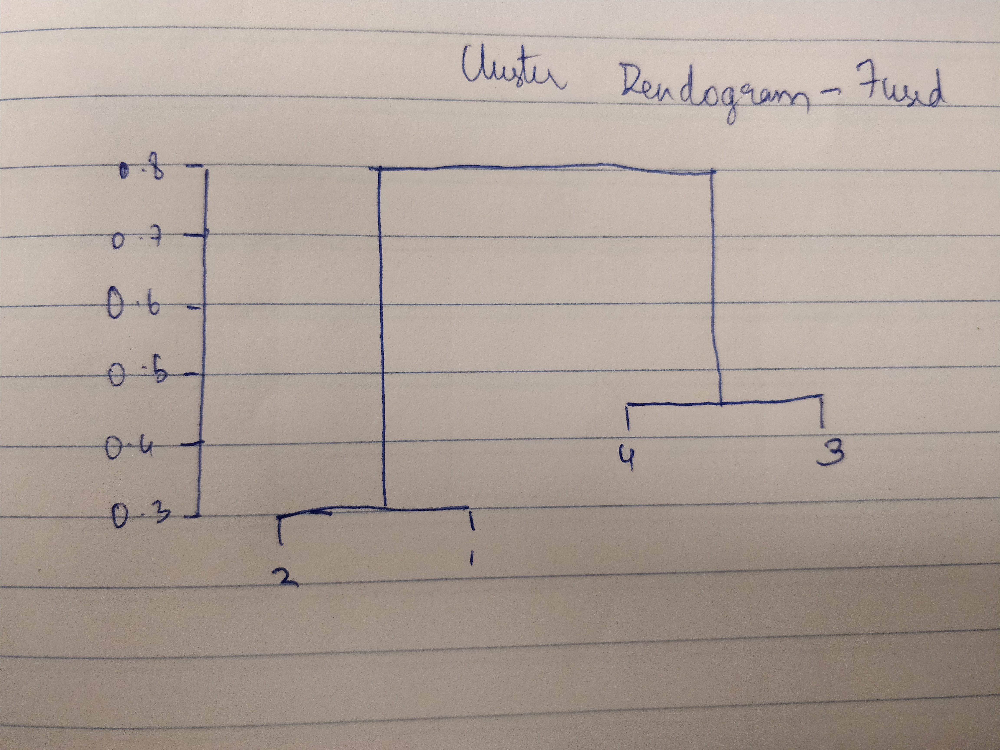

In [8]:
from IPython.display import Image, display
display(Image(filename=r'drive/IMG_20180414_183328.jpg'))